# Network Visualization in Python

---

A tutorial at NetSciX'19 by [Eduardo Graells-Garrido](https://twitter.com/carnby). Held on January 2nd, 2019. Happy New Year!


In this notebook we explore how to visualize networks with [NetworkX](http://networkx.github.io/), the most common library to analyze networks in Python.

Our purpose is to go through the following process:

  1. Load a network!
  2. Explore how NetworkX allows to visualize it.
  3. Define a task and find a visualization that solves this task.
  
### Requirements

  * External: graphviz
  * Python libraries: networkx, matplotlib, seaborn, scipy, cytoolz, pydot, python-louvain

## Initial Imports

Here we configure the notebook to import the most important libraries we are going to use.
We will import others throughout the notebook.

In [1]:
import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
import networkx as nx
import math

sns.set(context='notebook', style='ticks', font='Fira Sans Extra Condensed', palette='husl', font_scale=1.0)

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
import warnings
import matplotlib.cbook
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)

## Dataset: Jazz Network

This dataset was downloaded from the [Koblenz Network Collection](http://konect.uni-koblenz.de/networks/arenas-jazz).

In [3]:
!cat arenas-jazz/README.arenas-jazz

Jazz musicians network, part of the Koblenz Network Collection

This directory contains the TSV and related files of the arenas-jazz network:

This is the collaboration network between Jazz musicians.  Each node is a Jazz musician and an edge denotes that two musicians have played together in a band.  The data was collected in 2003. 


More information about the network is provided here: 
http://konect.uni-koblenz.de/networks/arenas-jazz

Files: 
    meta.arenas-jazz -- Metadata about the network 
    out.arenas-jazz -- The adjacency matrix of the network in space separated values format, with one edge per line
      The meaning of the columns in out.arenas-jazz are: 
        First column: ID of from node 
        Second column: ID of to node


Complete documentation about the file format can be found in the KONECT
handbook, in the section File Formats, available at:

http://konect.uni-koblenz.de/publications

All files are licensed under a Creative Commons Attribution-ShareAlike 2.0 G

In [4]:
!head arenas-jazz/out.arenas-jazz -n 10

% sym unweighted
1	10
1	11
1	12
1	13
1	14
1	15
1	16
1	17
1	18


Here we create an undirected network and create edges according to the network file:

In [5]:
network = nx.Graph()

with open('arenas-jazz/out.arenas-jazz') as f:
    lines = iter(f)
    next(f)
    
    for l in lines:    
        parts = l.strip().split()
        network.add_edge(int(parts[0]), int(parts[1]))
        
network.number_of_nodes(), network.number_of_edges()

(198, 2742)

NX has a very simple function to visualize a network: `draw_networkx`

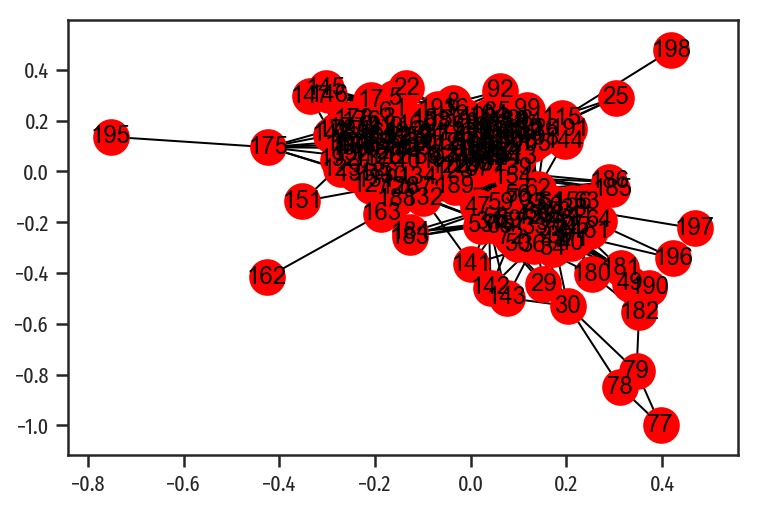

In [6]:
nx.draw_networkx(network)

Note that it uses `matplotlib`, which means that the visualization uses the same methods as statistical charts. It even includes labeled axes.
Let's make it bigger so it is easier to inspect:

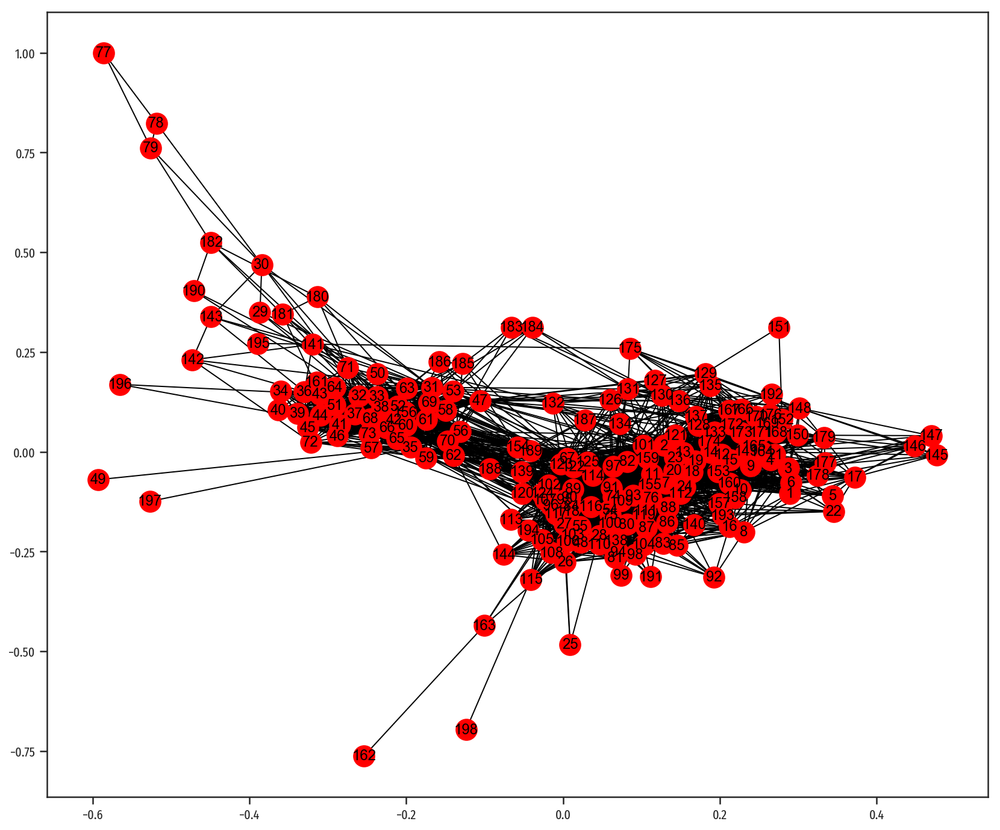

In [7]:
plt.figure(figsize=(14, 12))
nx.draw_networkx(network)

Bigger. Did you notice something?

**The network is not visualized in the same way!**

This happens because the layout algorithm used to organize nodes in the chart uses random initialization, and it is being called every time we draw the network.

In fact, NX includes several layouts. Some of them are deterministic, for instance, the _circular layout_ is one of them. It places each node in a circle, in the same order as nodes were added into the graph. It can be calculated with the `circular_layout` function. It looks like this:

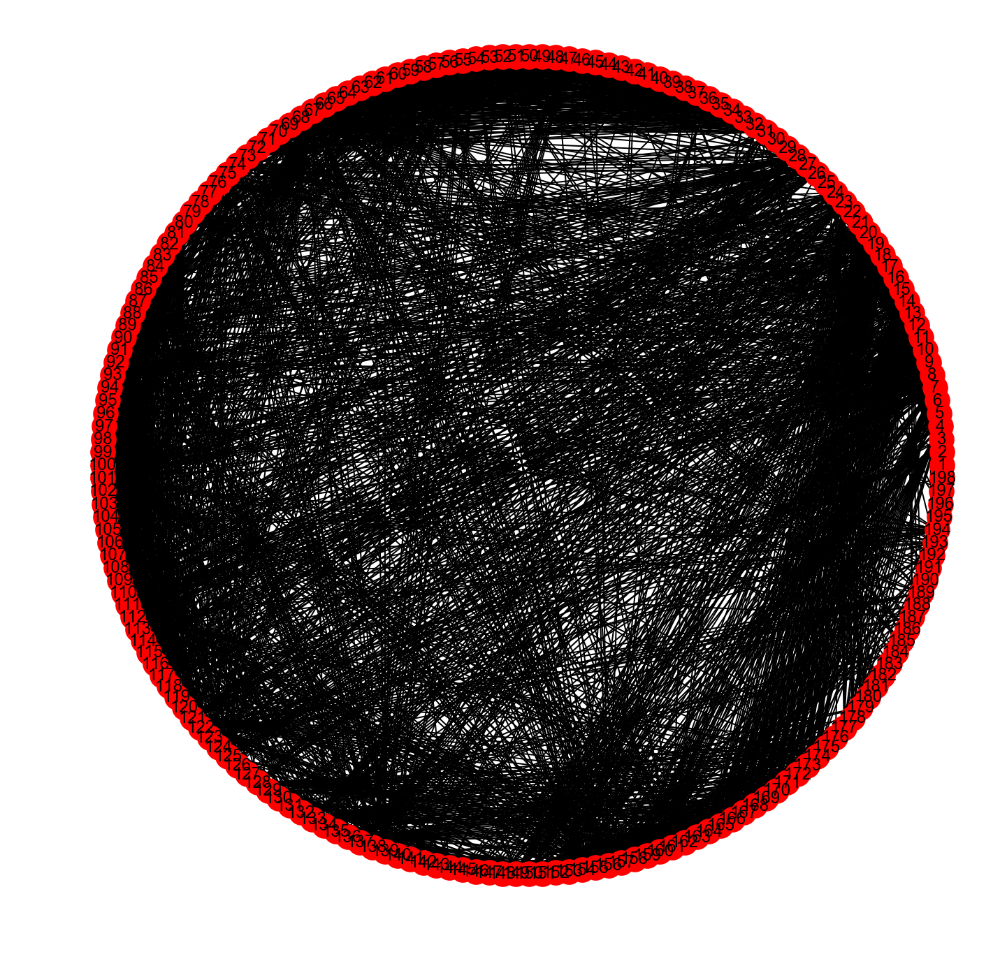

In [8]:
plt.figure(figsize=(12,12))
# the pos argument receives node positions.
nx.draw_networkx(network, pos=nx.layout.circular_layout(network))
# this removes the axes around the figure.
plt.axis('off');

Even though the layout is deterministic, it looks **awful**. Indeed, the default style in NX is not aesthetically pleasant. But, at the same time, it can be manipulated in a fairly direct way. We will do that later.

For now, let's explore other ways to layout the nodes. For instnce, through the `pydot` library, NX can use the `graphviz` family of tools. 
Here we try with the `twopi` tool to produce radial layouts:

In [9]:
positions = nx.drawing.nx_pydot.graphviz_layout(network, prog='twopi')

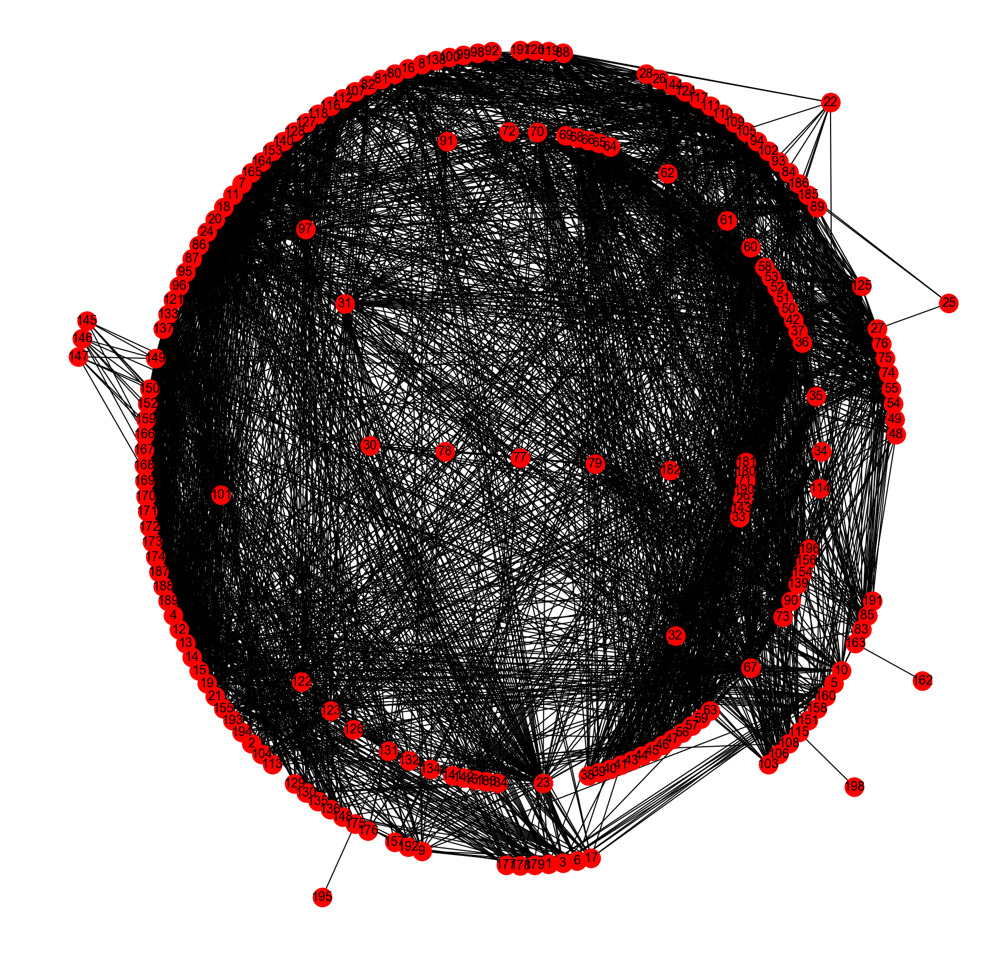

In [10]:
plt.figure(figsize=(16, 16))
nx.draw_networkx(network, pos=positions)
plt.axis('off');

These kinds of layouts can be very interesting when there are tree structures in the data. However, since we are dealing with a network of collaboration, this doesn't seem to be the case.

Let's try with one common method to layout nodes, `sfdp`:

In [11]:
positions = nx.drawing.nx_pydot.graphviz_layout(network, prog='sfdp')

We save the positions in a variable to refer to them later. In this way, all following charts will use the same node positions.

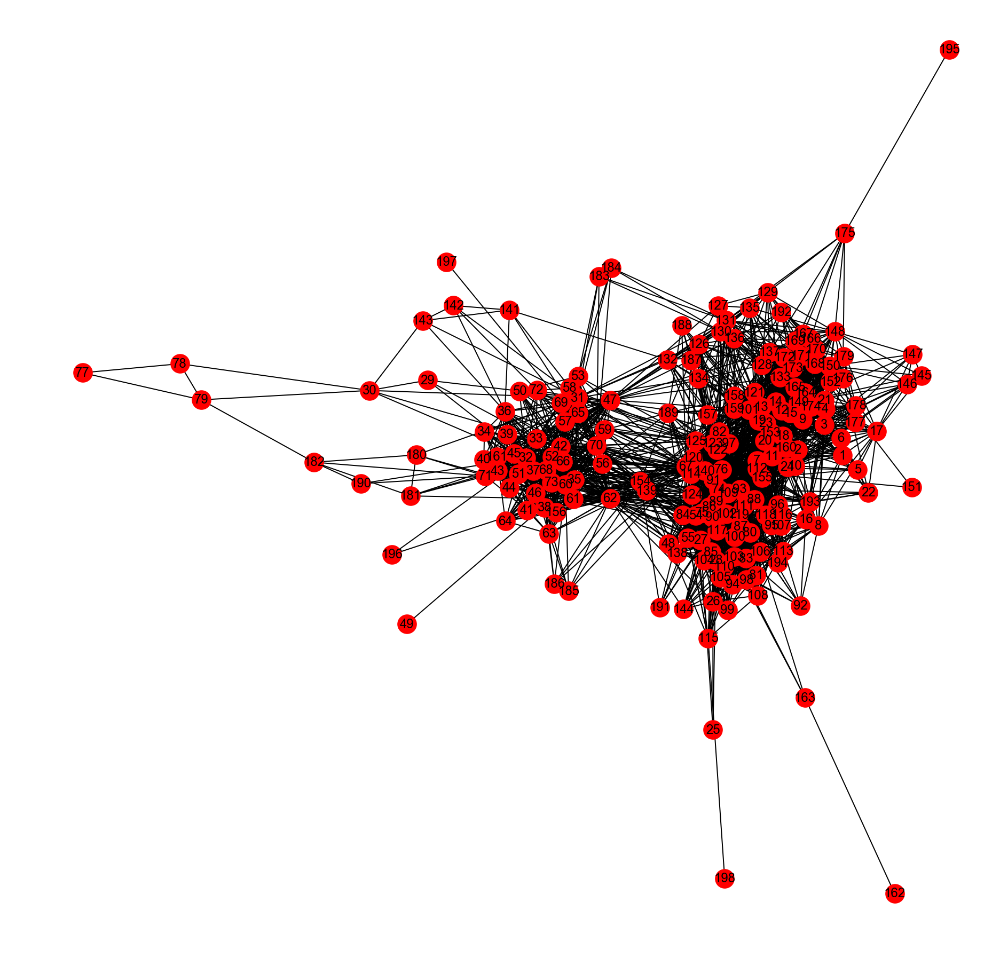

In [12]:
plt.figure(figsize=(16, 16))
nx.draw_networkx(network, pos=positions)
plt.axis('off');

This layout seems interesting. It seems that there are two big groups of collaborators, as well as some peripheral nodes. Let's start seeing how this works for common network tasks.

## Estimating and Visualizing Paths in the Network

One common task is to visualize paths in networks. For instance, every time you ask for directions in a maps application, you are observing the result of a short path estimation, and its corresponding visualization on the map. The main difference here is that, in maps, the territory is already the layout. 

In the case of a collaboration network, one potential interpretation of a shortest path is the sequence of people you have to contact to meet a specific person. 

Let's see how to visualize the path between random nodes in the network.
We import the `random` module to select nodes.

In [13]:
import random
# the nodes() method is an iterator of nodes. It can be traversed as a list, which is what random.sample receives as parameter.
random.sample(network.nodes(), 2)

[198, 10]

The `shortest_path` function in NX returns the sequence of nodes to go from the source node to the destination nodes used as parameters:

In [14]:
random_path = nx.shortest_path(network, *random.sample(network.nodes, 2))
random_path

[117, 7, 14]

Here we will do many things at once :)

- We will call `draw_networkx` twice: one time for the full network, another for the shortest path
- We will use parameters to both function calls to change the styling of the visualization.

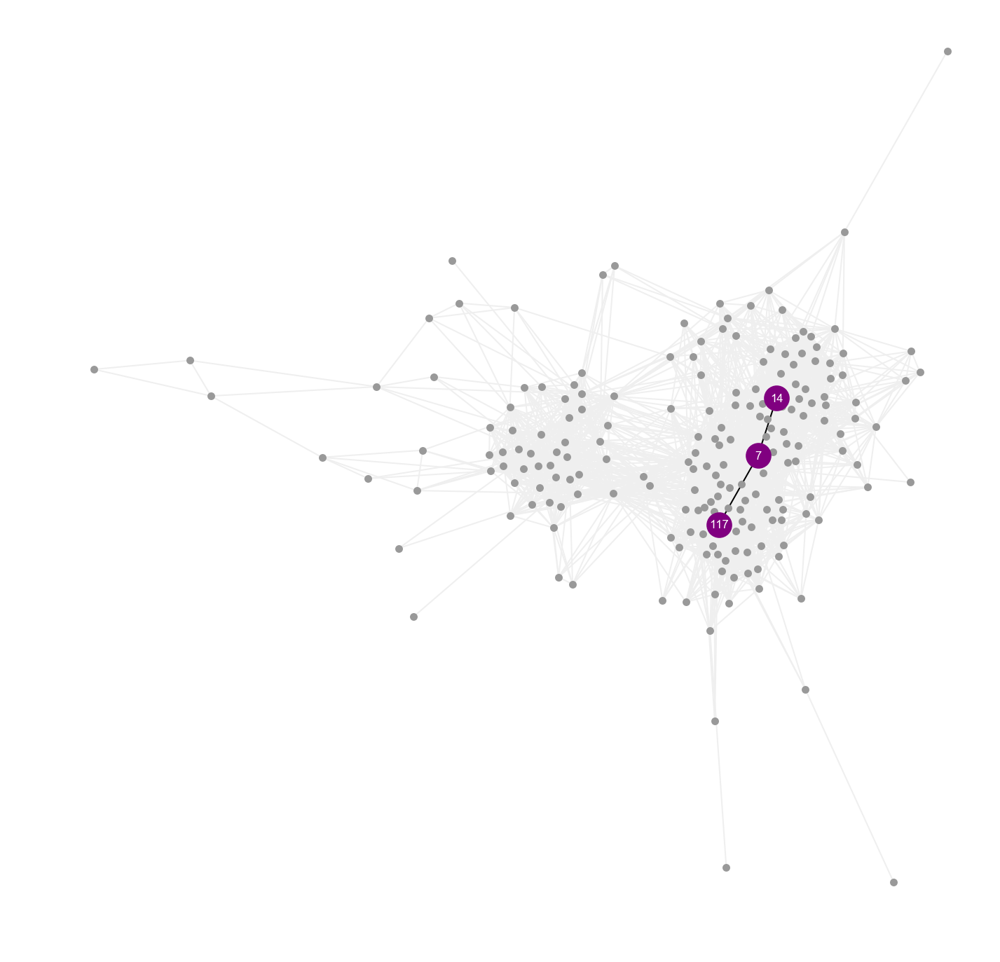

In [15]:
plt.figure(figsize=(12, 12))
nx.draw_networkx(network, pos=positions, node_color='#999999', edge_color='#efefef', with_labels=False, node_size=20)
nx.draw_networkx(nx.subgraph(network, random_path), pos=positions, node_color='purple', node_size=300, font_color='white', font_size='small')
plt.axis('off');

Indeed, with this layout the path is not only crearly visible, but we also have a grasp of whether the path crossed the different clusters that seem to be present on the data. 

The code also showcased that it is possible to style the visualization with parameters to the `draw_networkx` function.

However, we need to be careful: recall that layout clusters do not necessarily mean _real_ clusters or communities according to the network structure.


## Task: Community Detection

One common task in network analysis is to find communities of nodes, i.e., groups of nodes that are highly interconnected within them. Sometimes we may be interested in collective behavior, and thus, we may analyze the network patterns of communities instead of nodes. 

In our dataset, the visualization hints that there are at least two communities. Perhaps there are more. We don't know - yet. But, what would be the meaning of a community here? The dataset is about jazz musicians playing together. So maybe each community is related to playing styles, variations of jazz, locations where they play, etc. 

Most of the times, when we have a network we want to _infer_ its communities. One way of doing so is by using the Louvain Method, which we will not explain here, but it is implemented in the `community` library from the `python-louvain` module.

We will also import auxiliary methods from the `cytoolz` library.

In [16]:
import community
from cytoolz import keyfilter, valmap, valfilter, frequencies

The `generate_dendrogram` function estimates a set of community partitions of the dataset. This set is hierarchical, meaning that it first finds the communities of nodes from the original network, and then finds communities according to these communities.

In [17]:
dendrogram = community.generate_dendrogram(network, random_state=42)

By definition, the best community partition is found at the last level of the dendrogram. We can obtain this partition using the `partition_at_level` function:

In [18]:
communities = community.partition_at_level(dendrogram, len(dendrogram) - 1)

The `communities` variable is a dictionary with the following mapping: `{node_id -> community_id}`. It looks like this:

In [19]:
sample_keys = random.sample(communities.keys(), 5)
# just show the keys from the sample
keyfilter(lambda x: x in sample_keys, communities)

{12: 0, 83: 1, 88: 1, 98: 1, 195: 0}

Here we use the `frequencies` method to estimate the size and number of communities:

In [20]:
community_sizes = frequencies(communities.values())
community_sizes

{0: 60, 1: 43, 2: 34, 3: 61}

To visualize these communities, we will use a color palette. The `seaborn` library has a `color_palette` function that generates color lists.

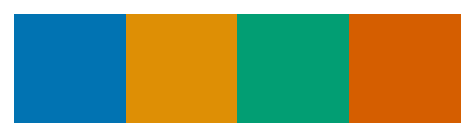

In [21]:
from matplotlib.colors import rgb2hex

# this generates the color palette
palette = sns.color_palette('colorblind', n_colors=len(community_sizes))
# this converts each color to a HEX representation. It is less efficient but easier to work with.
palette = list(map(rgb2hex, palette))
# this method renders a color list
sns.palplot(palette)
plt.axis('off');

We will build a mapping between nodes and colors, based on those communities. Since communities are indexed as numbers starting from 0, we can use them as indices in the palette list. Here is one way to obtain the color mapping with the `valmap` method from the `cytoolz` module:

In [22]:
node_colors = valmap(lambda x: palette[x], communities)
keyfilter(lambda x: x in sample_keys, node_colors)

{12: '#0173b2', 83: '#de8f05', 88: '#de8f05', 98: '#de8f05', 195: '#0173b2'}

We can use this mapping in the `node_color` parameter in the drawing function.

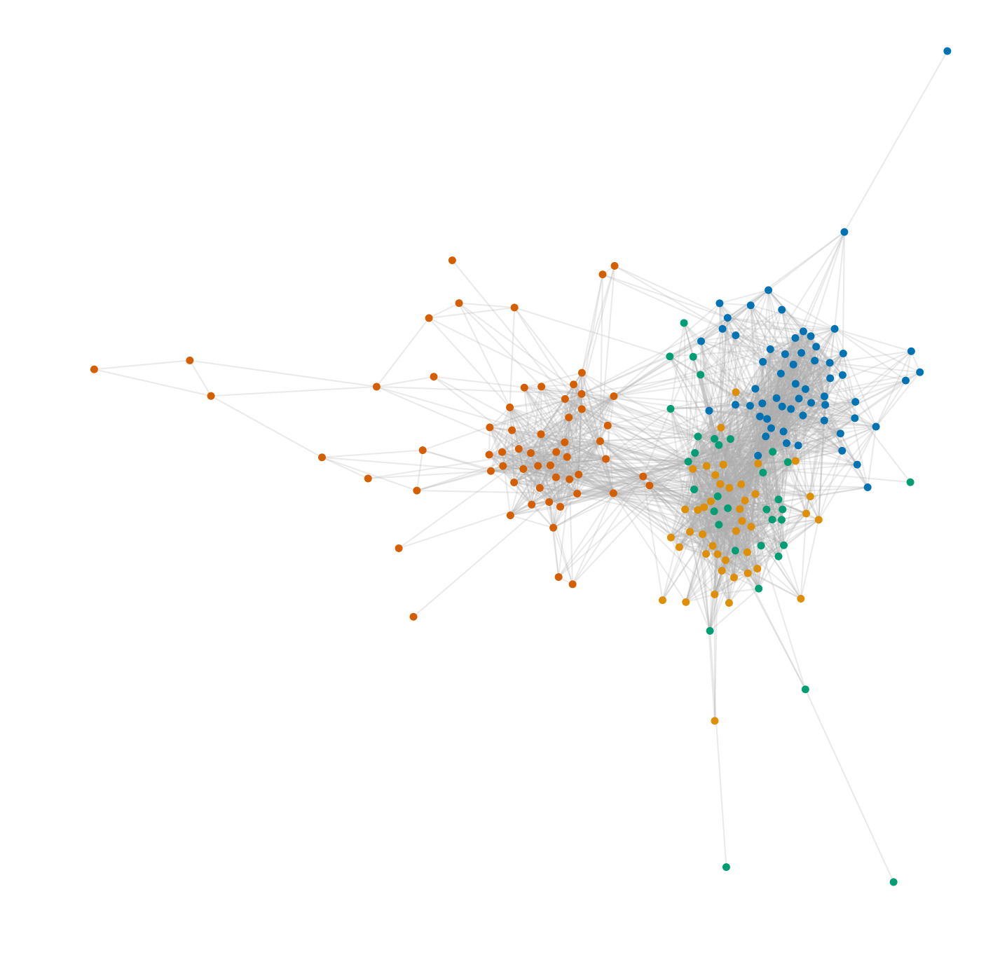

In [23]:
plt.figure(figsize=(12, 12))

nx.draw_networkx_edges(network, pos=positions, edge_color='#abacab', alpha=0.25, node_size=0)

nx.draw_networkx_nodes(network, pos=positions, 
                 # note that we cannot use the dictionary directly. unlike the pos parameter, this needs to be a list.
                 node_color=[node_colors[n] for n in network.nodes()],
                 node_size=20,
                 with_labels=False)

plt.axis('off');

Pretty good, isn't it? We estimated four communities, and by visualizing it, we observe that one of them is clearly different from the rest, which seem to be a bit intertwined. 

There are metrics to evaluate the estimation, however, it is not the focus of this notebook. What we are interested in is in how to visualize these communities in a way that we can observe how do they relate with each other.

One first approach would be to color edges according to the communities of its members. We can do so in the following way:

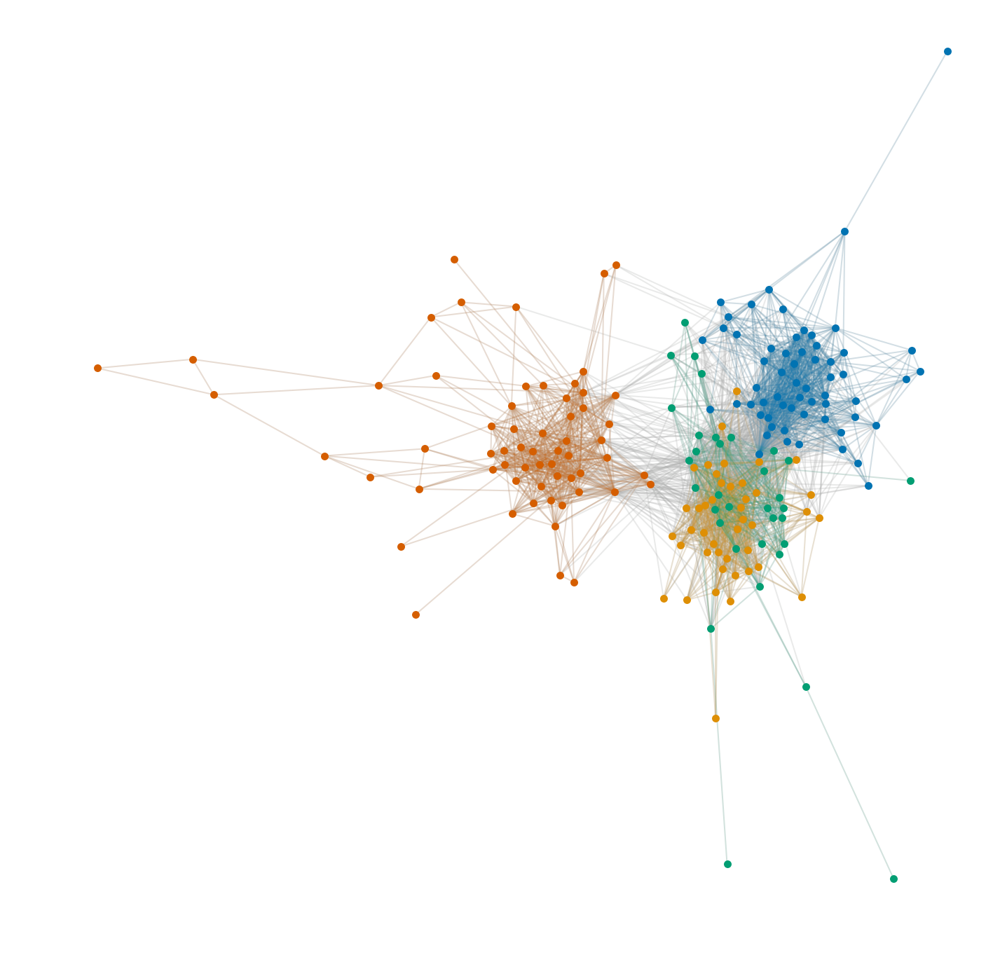

In [24]:
plt.figure(figsize=(12,12))

# draw all edges with the same color
nx.draw_networkx_edges(network, pos=positions, edge_color='#abacab', node_size=0, alpha=0.25)

# loop through communities to draw each sub-network with their own colors
for community_id, color in enumerate(palette, start=0):
    # find nodes within this community
    community_nodes = valfilter(lambda x: x == community_id, communities).keys()
    community_graph = nx.subgraph(network, community_nodes)

    nx.draw_networkx_edges(community_graph, pos=positions, edge_color=color, node_size=0, alpha=0.1)
    nx.draw_networkx_nodes(community_graph, pos=positions, node_color=color, node_size=20, with_labels=False)

plt.axis('off');

Looks great! 

However, some communities are so intertwined that it is hard to observe their connectivity. Another idea would be to try small multiples, which can be implemented in `matplotlib` with _subplots_:

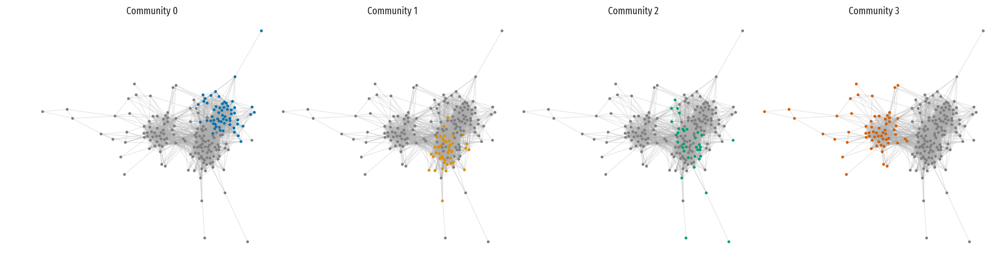

In [25]:
fig, axes = plt.subplots(nrows=1, ncols=len(community_sizes), sharex=False, sharey=True, figsize=(20, 5))

for community_id, ax in enumerate(axes, start=0):
    nx.draw_networkx_edges(network, pos=positions, edge_color='#abacab', alpha=0.25, node_size=0, ax=ax)

    _node_color = [rgb2hex(node_colors[n]) if communities[n] == community_id else 'grey' for n in network.nodes]
    
    nx.draw_networkx_nodes(network, pos=positions, 
                     node_color=_node_color,
                     node_size=5,
                     with_labels=False,
                     ax=ax)

    ax.set_axis_off()
    ax.set_title('Community {}'.format(community_id))
#plt.axis('off');
plt.subplots_adjust(wspace=0, hspace=0);

This is interesting. In this way we have a hard time finding how communities connect to each other, but we obtain a visual hint regarding how dispersed they are. We can further explore this by drawing a border around the community.

To do so we can use convex hulls. Fortunately, the `scipy` library already implements this geometric operation!

In [26]:
from scipy.spatial import ConvexHull
import numpy as np

In [27]:
community_hull = {}

for community_id in range(len(community_sizes)):
    community_nodes = valfilter(lambda x: x == community_id, communities).keys()
    community_positions = keyfilter(lambda x: x in community_nodes, positions)
    
    # here we estimate the convex hull of each community
    community_points = np.array(list(community_positions.values()))
    hull = ConvexHull(community_points)

    community_hull[community_id] = np.array([community_points[i] for i in hull.vertices])

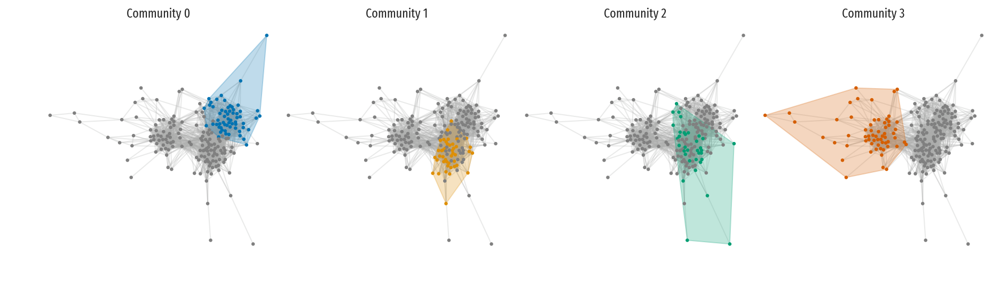

In [28]:
fig, axes = plt.subplots(nrows=1, ncols=len(community_sizes), sharex=False, sharey=True, figsize=(16, 4))

for community_id, ax in enumerate(axes, start=0):
    nx.draw_networkx_edges(network, pos=positions, edge_color='#abacab', alpha=0.25, node_size=0, ax=ax)

    _node_color = [rgb2hex(node_colors[n]) if communities[n] == community_id else 'grey' for n in network.nodes]

    
    nx.draw_networkx_nodes(network, pos=positions, 
                     node_color=_node_color,
                     node_size=5,
                     with_labels=False,
                     ax=ax)

    # draw a polygon containing the community
    ax.fill(community_hull[community_id][:,0], community_hull[community_id][:,1], color=palette[community_id], edgecolor='black', alpha=0.25)
    ax.set_axis_off()
    ax.set_title('Community {}'.format(community_id))

plt.subplots_adjust(wspace=0, hspace=0);

Although the idea sounded good (to me at least), the result does not seem to be very useful. 

---

Recall that we displayed the network with the circular layout. We tested the results with the default styling, which looked ugly. Let's see how it looks with the styling options we have explored:

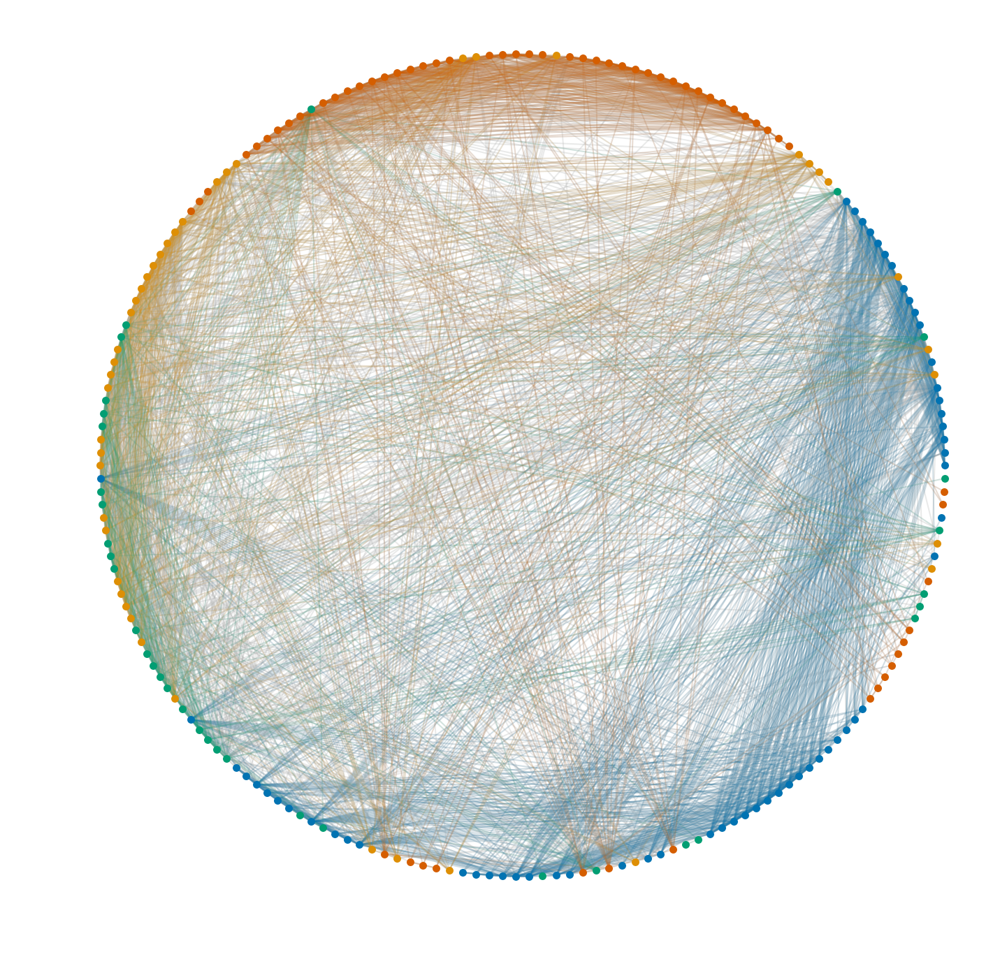

In [29]:
# estimate the positions with the circular layout
pos = nx.layout.circular_layout(network)

# the same code as before
plt.figure(figsize=(12,12))

# draw all edges with the same color
nx.draw_networkx_edges(network, pos=pos, edge_color='#abacab', node_size=0, alpha=0.25)

# loop through communities to draw each sub-network with their own colors
for community_id, color in enumerate(palette, start=0):
    # find nodes within this community
    community_nodes = valfilter(lambda x: x == community_id, communities).keys()
    community_graph = nx.subgraph(network, community_nodes)

    nx.draw_networkx_edges(community_graph, pos=pos, edge_color=color, node_size=0, alpha=0.1)
    nx.draw_networkx_nodes(community_graph, pos=pos, node_color=color, node_size=20, with_labels=False)

plt.axis('off');

Not bad! This seems like a more promising way of finding how communities relate to each other.

There are two subtasks that we have to solve here. The first one is to order the nodes according to the community they belong to. The second one is to find a way to declutter the edges. There is one way of doing both at the same time: **Hierarchical Edge Bundling**.

However, in HEB we need a hierarchy of nodes. We don't have it. How can we use the technique?

It turns out that we already estimated such hierarchy. It's available on the community dendrogram we obtained with the Louvain method. Let's go for it!

## Hierarchical Edge Bundling

The first thing we need to do is to formalize the hierarchy into a tree. This code does it. For now, consider it as _black magic_ that does the following:

- The leaf nodes are those from the original network
- Each level up is the set of communities inferred with the Louvain method, according to the dendrogram

In [30]:
community_structure = nx.DiGraph()

node_from_h = {}

dst_to_node = None

for level, comms in enumerate(dendrogram, start=0):
    #print(comms)
    if dst_to_node is None:
        src_to_node = {}
    else:
        src_to_node = dst_to_node
        
    dst_to_node = {}
    
    for src, dst in comms.items():
        if not src in src_to_node:
            src_node_id = community_structure.number_of_nodes()
            community_structure.add_node(src_node_id)
            src_to_node[src] = src_node_id
            
            node_from_h[src_node_id] = src
            
        if not dst in dst_to_node:
            dst_node_id = community_structure.number_of_nodes()
            community_structure.add_node(dst_node_id)
            dst_to_node[dst] = dst_node_id
            
        community_structure.add_edge(dst_to_node[dst], src_to_node[src])
        
root_node_id = community_structure.number_of_nodes()
community_structure.add_node(root_node_id)

for src, dst in dendrogram[-1].items():
    community_structure.add_edge(root_node_id, dst_to_node[dst])
    
community_structure.number_of_nodes(), community_structure.number_of_edges()

(210, 209)

We can test whether this is a tree:

In [31]:
nx.is_tree(community_structure)

True

We will sort these nodes in a radial layout with the `twopi` program from `graphviz`:

In [32]:
hierarchical_pos = nx.drawing.nx_pydot.graphviz_layout(community_structure, prog='twopi', root=root_node_id)

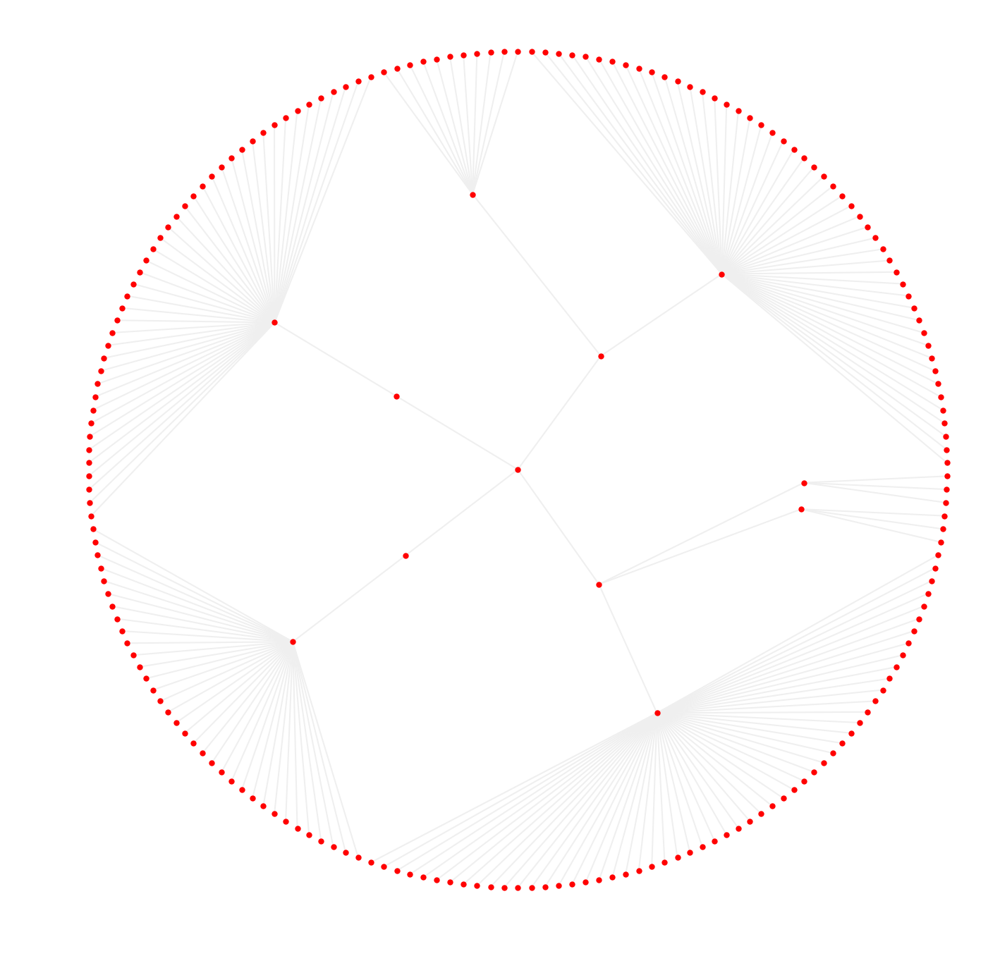

In [33]:
plt.figure(figsize=(12, 12))
nx.draw_networkx(community_structure, with_labels=False, node_size=10, pos=hierarchical_pos, arrows=False, edge_color='#efefef')
plt.axis('off');

Note how nodes are sorted according to their parents. In this case, the nodes that form a circle are musicians, and the inner nodes are communities. We added an artificial root node so we can link communities together. 

The next step is to save the positions of each node of the original network:

In [34]:
from cytoolz import keymap

circular_positions = keyfilter(lambda x: x in node_from_h, hierarchical_pos)
circular_positions = keymap(lambda x: node_from_h[x], circular_positions)
len(circular_positions), network.number_of_nodes()

(198, 198)

Let's see a comparison of the two circular layouts side by side:

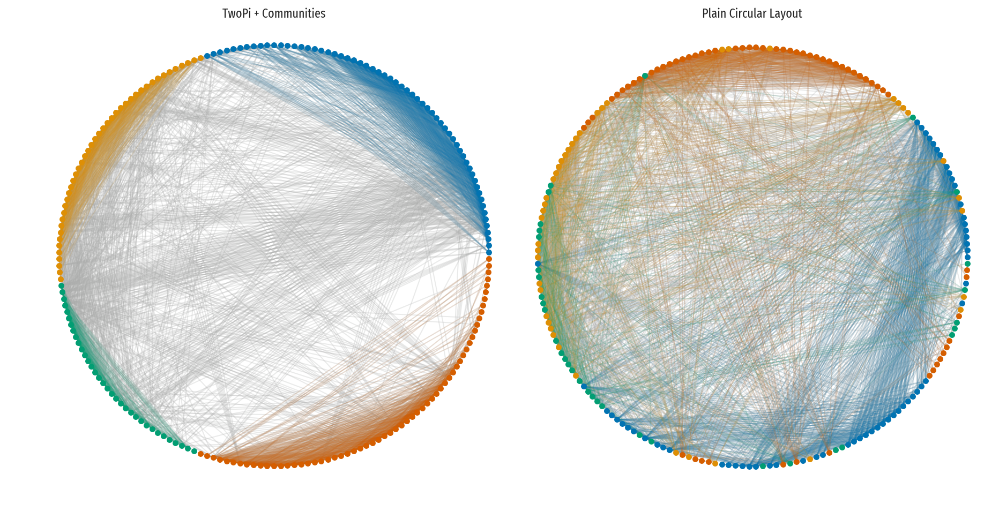

In [35]:
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# layout using communities
nx.draw_networkx_edges(network, pos=circular_positions, edge_color='#abacab', node_size=0, alpha=0.25, ax=axes[0])

for community_id, color in enumerate(palette, start=0):
    community_nodes = valfilter(lambda x: x == community_id, communities).keys()
    community_graph = nx.subgraph(network, community_nodes)
    nx.draw_networkx_edges(community_graph, pos=circular_positions, edge_color=rgb2hex(color), node_size=0, alpha=0.1, ax=axes[0])
    nx.draw_networkx_nodes(community_graph, pos=circular_positions, node_color=rgb2hex(color), node_size=20, with_labels=False, ax=axes[0])

axes[0].set_axis_off()
axes[0].set_title('TwoPi + Communities')

# circular layout with networkx
# layout using communities
circular_layout_positions = nx.circular_layout(network)

nx.draw_networkx_edges(network, pos=circular_layout_positions, edge_color='#abacab', node_size=0, alpha=0.25, ax=axes[1])

for community_id, color in enumerate(palette, start=0):
    community_nodes = valfilter(lambda x: x == community_id, communities).keys()
    community_graph = nx.subgraph(network, community_nodes)
    nx.draw_networkx_edges(community_graph, pos=circular_layout_positions, edge_color=rgb2hex(color), node_size=0, alpha=0.1, ax=axes[1])
    nx.draw_networkx_nodes(community_graph, pos=circular_layout_positions, node_color=rgb2hex(color), node_size=20, with_labels=False, ax=axes[1])

axes[1].set_axis_off()
axes[1].set_title('Plain Circular Layout')

plt.subplots_adjust(wspace=0, hspace=0);

Much better! But there is still work to do, as it is still hard to see edges given the clutter.

To implement HEB, we will use the community structure to draw edges between nodes. 
Instead of a line connecting the nodes of each edge, the path between two nodes in the structure will be rendered. 
Particularly, the points of those paths will be used as control points to a B-Spline curve. Fortunately, there are b-splines in Python implemented in the `scipy` library. 
A quick way of using it is available from [Stack Overflow](https://stackoverflow.com/questions/34803197/fast-b-spline-algorithm-with-numpy-scipy): 

In [36]:
# source: https://stackoverflow.com/questions/34803197/fast-b-spline-algorithm-with-numpy-scipy
import scipy.interpolate as si

def scipy_bspline(cv, n=100, degree=3, periodic=False):
    """ Calculate n samples on a bspline

        cv :      Array ov control vertices
        n  :      Number of samples to return
        degree:   Curve degree
        periodic: True - Curve is closed
    """
    cv = np.asarray(cv)
    count = cv.shape[0]

    # Closed curve
    if periodic:
        kv = np.arange(-degree,count+degree+1)
        factor, fraction = divmod(count+degree+1, count)
        cv = np.roll(np.concatenate((cv,) * factor + (cv[:fraction],)),-1,axis=0)
        degree = np.clip(degree,1,degree)

    # Opened curve
    else:
        degree = np.clip(degree,1,count-1)
        kv = np.clip(np.arange(count+degree+1)-degree,0,count-degree)

    # Return samples
    max_param = count - (degree * (1-periodic))
    spl = si.BSpline(kv, cv, degree)
    return spl(np.linspace(0,max_param,n))

In [37]:
from cytoolz import itemmap
node_to_h = itemmap(reversed, node_from_h)
community_structure_undirected = community_structure.to_undirected()

Here we estimate the line that will be drawn for each edge. We save this in a list, because it is a bit expensive.

In [38]:
edge_lines = []

for src, dst in network.edges():    
    edge_path = nx.shortest_path(community_structure_undirected, node_to_h[src], node_to_h[dst])
    edge_cp = [hierarchical_pos[node_id] for node_id in edge_path]

    try:    
        edge_lines.append(scipy_bspline(edge_cp, degree=min(len(edge_cp) - 1, 3), n=50))
    except ValueError:
        print(src, dst, 'error')

We will use our own drawing method. We need to estimate edge colors manually this time:

In [39]:
edge_colors = []

for src, dst in network.edges():
    if communities[src] == communities[dst]:
        edge_colors.append(node_colors[src])
    else:
        edge_colors.append('grey')

We already estimated all we need to have a proof-of-concept implementation of HEB. This is how it looks:

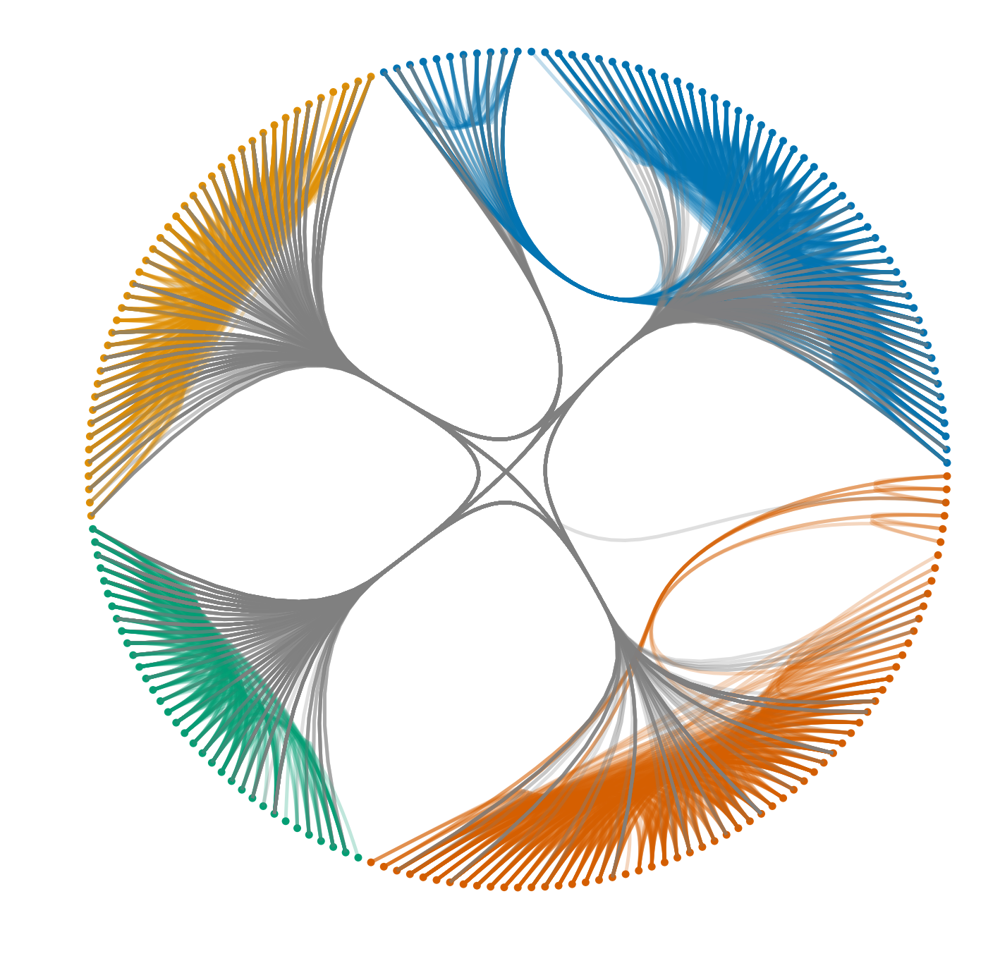

In [40]:
from matplotlib.collections import LineCollection

plt.figure(figsize=(12, 12))

nx.draw_networkx_nodes(network, pos=circular_positions, 
                 node_color=[node_colors[n] for n in network.nodes],
                 node_size=20,
                 with_labels=False)

edge_collection = LineCollection(edge_lines, color=edge_colors, linewidth=2.5, linestyle='solid', alpha=0.25)
plt.gca().add_collection(edge_collection)

plt.axis('off');

Amazing, isnt' it? We still need to figure a way to color the grey edges that connect communities, however, we can see hints of sub-communities within communities, as well as to identify nodes that are popular within communities but disconnected from the other groups, and viceversa. Think how useful would be something like this for a music manager!

Now, let's plot the network visualizations together to see how much we have learned today:

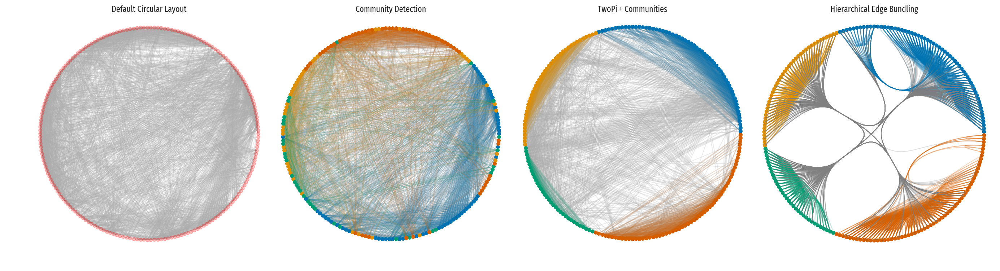

In [41]:
fig, axes = plt.subplots(1, 4, figsize=(24, 6))

# circular layout with networkx
circular_layout_positions = nx.circular_layout(network)

# default

nx.draw_networkx(network, pos=nx.layout.circular_layout(network), edge_color='#abacab', node_size=20, alpha=0.25, with_labels=False, ax=axes[0])
axes[0].set_axis_off()
axes[0].set_title('Default Circular Layout')


nx.draw_networkx_edges(network, pos=circular_layout_positions, edge_color='#abacab', node_size=0, alpha=0.25, ax=axes[1])

for community_id, color in enumerate(palette, start=0):
    community_nodes = valfilter(lambda x: x == community_id, communities).keys()
    community_graph = nx.subgraph(network, community_nodes)
    nx.draw_networkx_edges(community_graph, pos=circular_layout_positions, edge_color=rgb2hex(color), node_size=0, alpha=0.1, ax=axes[1])
    nx.draw_networkx_nodes(community_graph, pos=circular_layout_positions, node_color=rgb2hex(color), node_size=20, with_labels=False, ax=axes[1])

axes[1].set_axis_off()
axes[1].set_title('Community Detection')

# layout using communities
nx.draw_networkx_edges(network, pos=circular_positions, edge_color='#abacab', node_size=0, alpha=0.25, ax=axes[2])

for community_id, color in enumerate(palette, start=0):
    community_nodes = valfilter(lambda x: x == community_id, communities).keys()
    community_graph = nx.subgraph(network, community_nodes)
    nx.draw_networkx_edges(community_graph, pos=circular_positions, edge_color=rgb2hex(color), node_size=0, alpha=0.1, ax=axes[2])
    nx.draw_networkx_nodes(community_graph, pos=circular_positions, node_color=rgb2hex(color), node_size=20, with_labels=False, ax=axes[2])

axes[2].set_axis_off()
axes[2].set_title('TwoPi + Communities')


# HEB
nx.draw_networkx_nodes(network, pos=circular_positions, 
                 node_color=[node_colors[n] for n in network.nodes],
                 node_size=20,
                 with_labels=False, ax=axes[3])

edge_collection = LineCollection(edge_lines, color=edge_colors, linewidth=1, linestyle='solid', alpha=0.25)
axes[3].add_collection(edge_collection)
axes[3].set_axis_off()
axes[3].set_title('Hierarchical Edge Bundling')

plt.subplots_adjust(wspace=0, hspace=0);

There is one thing left.

What if we want to know who is who in the visualization? After all, musicians have names! 

Even though the dataset does not contain names of the actual persons in the network, we can assign a label to each node based on the node id. The following code renders a label to each node by estimating its position with respect to the circle center.

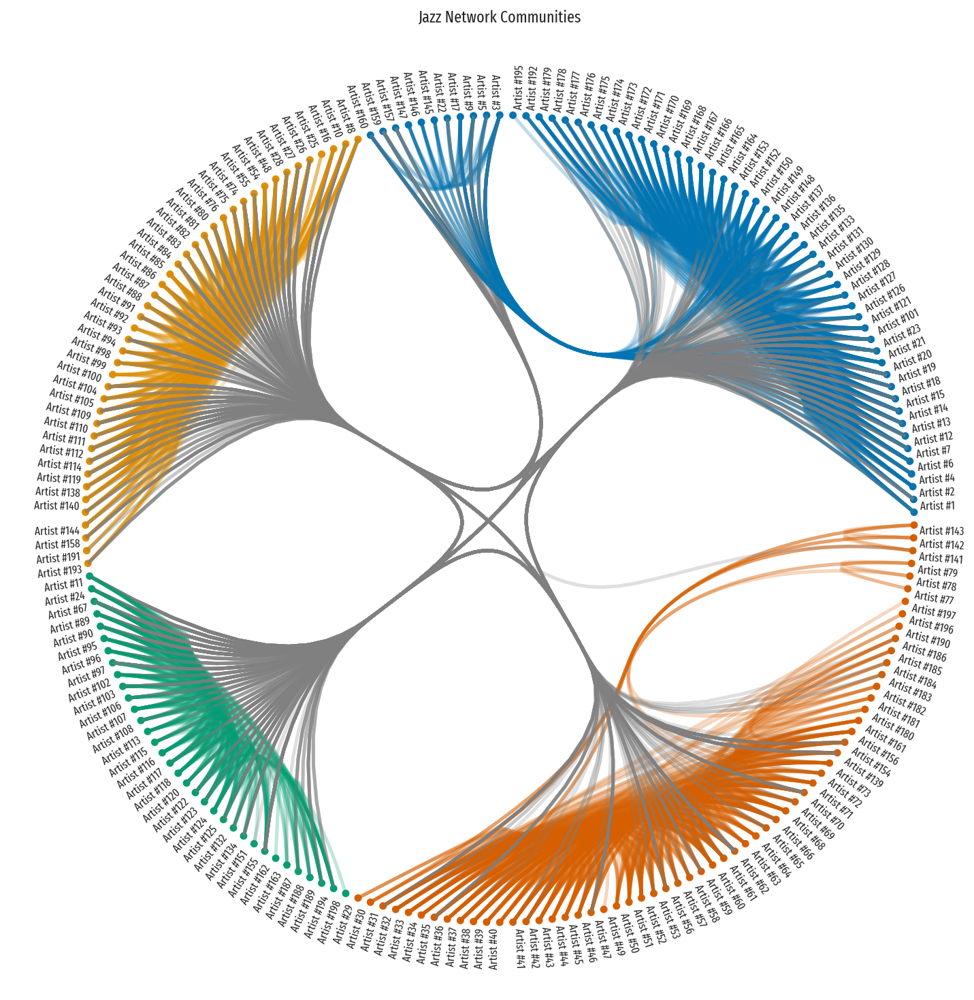

In [42]:
plt.figure(figsize=(12, 12))

nx.draw_networkx_nodes(network, pos=circular_positions, 
                 node_color=[node_colors[n] for n in network.nodes],
                 node_size=20,
                 with_labels=False)

edge_collection = LineCollection(edge_lines, color=edge_colors, linewidth=2.5, linestyle='solid', alpha=0.25)
plt.gca().add_collection(edge_collection)

# artist labels
# we need to orient them with respect to the center of the circle
centroid = np.mean(list(circular_positions.values()), axis=0)

for node_id, pos in circular_positions.items():
    pos = np.array(pos)
    vec = pos - centroid
    length = np.sqrt(vec.dot(vec)) + 3
    vec = vec / length
    angle = np.arctan2(vec[1], vec[0])
    
    ha = 'left'
    va = 'bottom'
    text_rotation = np.rad2deg(angle)
    
    if vec[1] < 0:
        va = 'top'
        
    if vec[0] < 0:
        ha = 'right'
        
    if text_rotation > 90:
        text_rotation = text_rotation - 180
    elif text_rotation < -90:
        text_rotation = text_rotation + 180
        
    # '{:.2f} {}'.format(text_rotation, node_id)
    plt.annotate('Artist #{}'.format(node_id), 
                 (centroid[0] + length * np.cos(angle), centroid[1] + length * np.sin(angle)), 
                 rotation=text_rotation, ha=ha, va=va, 
                 fontsize='small')
    #break
    
plt.title('Jazz Network Communities', y=1.05)
plt.axis('off');

With this we finish this notebook. I will keep working on it to add more features and make some explanations clearer. I want to improve the HEB implementation as well.

If you have any comments, suggestions, doubts, and ideas for new tasks, contact me! :) 

Cheers,

--Edu